In [5]:
import numpy as np
import pandas as pd
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
from nltk.stem.porter import PorterStemmer
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\njhar\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
!pip install wordcloud

In [7]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [8]:
df = pd.read_csv(r'C:\Users\njhar\Downloads\Twitter_Data.csv')

In [9]:
df.head()

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [10]:
# labels changing category to rating

df = df.rename(columns={'category': 'rating'})
df.head()

,clean_text,rating
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [11]:
# data preprocessing
# missing values

df.isna().sum()

clean_text    4
rating        7
dtype: int64

In [12]:
df.dropna()

,clean_text,rating
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0
...,...,...
162975,why these 456 crores paid neerav modi not reco...,-1.0
162976,dear rss terrorist payal gawar what about modi...,-1.0
162977,did you cover her interaction forum where she ...,0.0
162978,there big project came into india modi dream p...,0.0


In [13]:
# Duplicated values

dup = df.duplicated()
df[dup]

,clean_text,rating
159443,NaN,0.0


In [14]:
# unique values

df.nunique()

clean_text    162976
rating             3
dtype: int64

In [15]:
# data information

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162980 entries, 0 to 162979
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   clean_text  162976 non-null  object 
 1   rating      162973 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.5+ MB


In [16]:
df.shape

(162980, 2)

In [17]:
df.columns

Index(['clean_text', 'rating'], dtype='object')

In [18]:
df.dtypes

clean_text     object
rating        float64
dtype: object

In [19]:
# changing 'Nan' to 0

df['rating'] = df['rating'].fillna(0)

In [20]:
# changing Float to Integer

df['rating'] = df['rating'].astype(int)

In [21]:
df.dtypes

clean_text    object
rating         int32
dtype: object

In [22]:
# changing dtype object to string

df['clean_text'] = df['clean_text'].dropna()

In [23]:
df['clean_text'] = df['clean_text'].apply(str)

In [24]:
df.dtypes

clean_text    object
rating         int32
dtype: object

In [26]:
# -1 ----- negative review
#  0 ----- nutural
#  1 ----- positive review
df.head()

,clean_text,rating
0,when modi promised “minimum government maximum...,-1
1,talk all the nonsense and continue all the dra...,0
2,what did just say vote for modi welcome bjp t...,1
3,asking his supporters prefix chowkidar their n...,1
4,answer who among these the most powerful world...,1


In [27]:
df.dtypes

clean_text    object
rating         int32
dtype: object

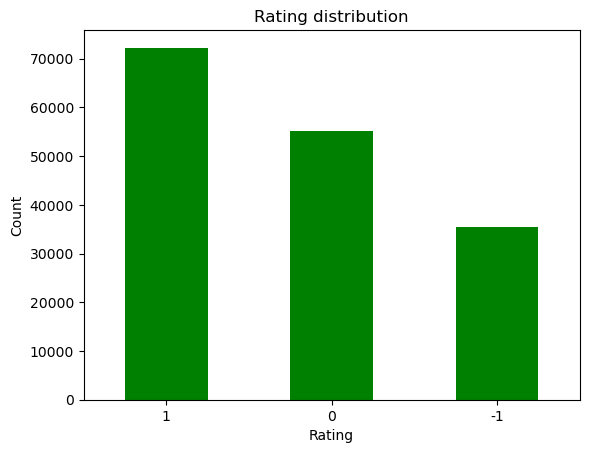

In [28]:
# Bar plot for the rating distribution

df['rating'].value_counts().plot.bar(color = 'green')
plt.title('Rating distribution')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.xticks(rotation = 0)
plt.show()

In [29]:
# stopwords 

print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [30]:
# stemming the words in the "clan_text"

port_stemming = PorterStemmer()

def stemming(data):
    stem_data = re.sub('[^a-zA-Z]',' ',data) # remove all the special characters
    stem_data = stem_data.lower() # change upper to lower
    stem_data = stem_data.split() # split all the words and put into the list
    stem_data = [port_stemming.stem(word) for word in stem_data if not word in stopwords.words('english')] # reduce the words and for root words
    stem_data = ' '.join(stem_data)
    
    return stem_data

In [31]:
df['cleaned_text'] = df['clean_text'].apply(stemming)

In [32]:
df.head()

,clean_text,rating,cleaned_text
0,when modi promised “minimum government maximum...,-1,modi promis minimum govern maximum govern expe...
1,talk all the nonsense and continue all the dra...,0,talk nonsens continu drama vote modi
2,what did just say vote for modi welcome bjp t...,1,say vote modi welcom bjp told rahul main campa...
3,asking his supporters prefix chowkidar their n...,1,ask support prefix chowkidar name modi great s...
4,answer who among these the most powerful world...,1,answer among power world leader today trump pu...


In [33]:
# changing dtype object to string

df['cleaned_text'] = df['cleaned_text'].fillna('')

In [34]:
df['cleaned_text'] = df['cleaned_text'].apply(str)               

In [35]:
df.dtypes

clean_text      object
rating           int32
cleaned_text    object
dtype: object

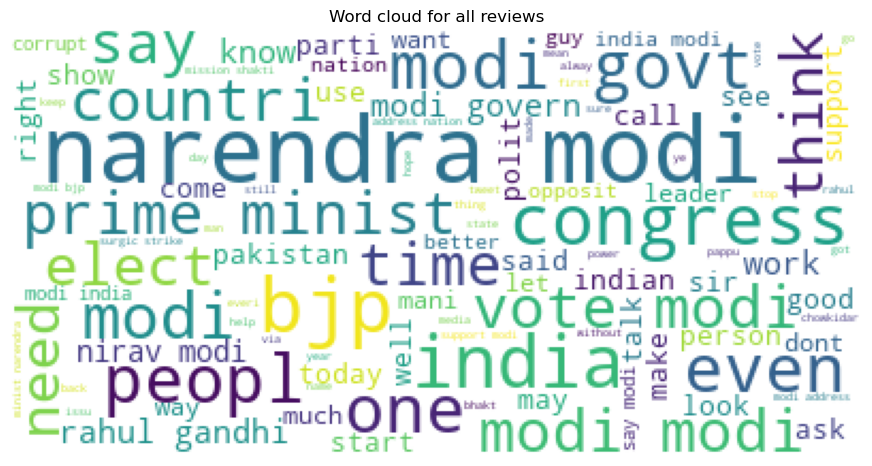

In [36]:
# combine all the reviews

review = " ".join([rating for rating in df['cleaned_text']])

# initialize wordcloud 
plt.figure(figsize = (11,7))
wc = WordCloud(max_words = 100, background_color = 'white')
plt.imshow(wc.generate(review))
plt.title("Word cloud for all reviews")
plt.axis('off')
plt.show()

In [37]:
# Negative reviews 

negative_reviews = df[df['rating'] == -1]
negative_text = " ".join(review for review in negative_reviews.cleaned_text)

# Neutral reviews

neutral_reviews = df[df['rating'] == 0]
neutral_text = " ".join(review for review in neutral_reviews.cleaned_text)

# positive reviews

pos_reviews = df[df['rating'] == 1]
pos_text = " ".join(review for review in pos_reviews.cleaned_text)

In [38]:
# negative words
negative_text

'modi promis minimum govern maximum govern expect begin difficult job reform state take year get justic state busi exit psu templ vote parti leadershipwho take fast firm action none narendra damodarda modi bjp parti write chowkidar mean anti modi tri visit plz use anti firm belief leadership shri narendra modi bjp enter polit given form file nomin khammam parliamentari seat proceed khammam today sultanpur uttar pradesh loksabha candid select pawan kumar pandey actual public want given vote modi current condid popular district candid bsp candid sonbhadra singh thiugh nehru aliv still aliv heart modi everi failur nehru respons modi govt slash india educ budget clear indic dont care india futur congress presid shri hand ensur increas budget gdp futur india deserv peopl made amazedn fear frustat may result vote sir wast ministerdisgrac entir modi cabinet peopl wish vision india least interest person enmiti modi other person problem handl person dont expect nation join dirti fight other tel

In [39]:
# neutral words
neutral_text

'talk nonsens continu drama vote modi kiya tho refresh maarkefir comment karo surat women perform yagna seek divin grace narendra modi becom come cabinet scholar like modi smriti hema time introspect one vote make differ anil kapoor answer modi elect clarion call extend support vote kar campaign one vote make differ anil kapoor answer modi elect clarion call extend support campaign vote modi creat job vote ensur govt need deserv anupam kher respond modi appeal elect crush jaw shoutmodimodi say jd mla incit murder alreadi taken notic order probe time modi take notic muslim famili harass beaten recent extremist hindu suggest leav india move pakistan wait modi also talk varanasi accord yogi imran masood kin azhar masood accord logic nirav modi lalit modi narendra modi brother mother agre tenur modiganga rejuven work start work vote ensur govt need deserv anupam kher respond modi vote kar appeal elect modi maid say rahul keep say modi kalla yet goe hug wink magand idu bekagittu pleas vote 

In [40]:
# positive words
pos_text

'say vote modi welcom bjp told rahul main campaign modi think modi relax ask support prefix chowkidar name modi great servic confus read crustal clear crass filthi nonsens see abus come chowkidar answer among power world leader today trump putin modi may upcom elect india saga go import pair look current modi lead govt elect deal brexit combin weekli look juici bear imho gandhi gay modi thing like demonetis gst good servic tax upper cast would sort either view favour say need give time cast like dalit muslim modi constitu hope tuthukudi peopl would prefer honest well behav nationalist courag likli minist modi cabinet vote benifit thuthukudi calm water where modi wave dont play word talk modi swami relat guru say good chowkidar protect good mind tweet dark side terror brighter side better know one recent said peopl vote modi anti nation put gen hooda congress support jawan support modi anti nation great thing hear develop becom mass movement modi govt econom social polit empower life on

In [41]:
# Negative reviews 

wordcloud = WordCloud(max_words=100, background_color='white', width=800, height=400).generate(negative_text)

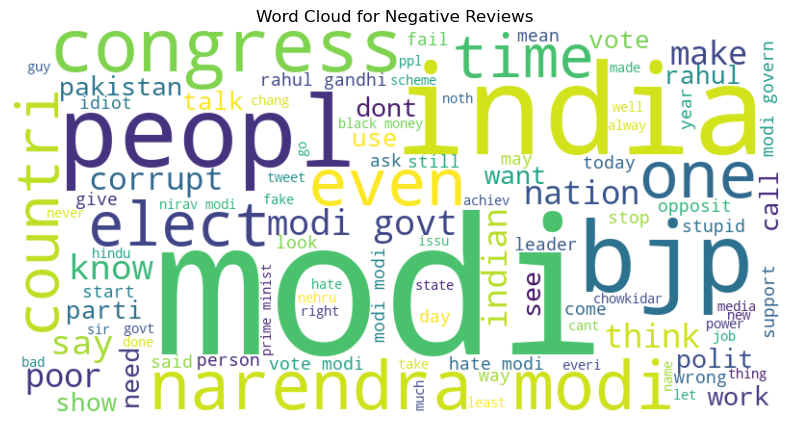

In [42]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud for Negative Reviews")
plt.show()

In [43]:
# neutral Word cloud

In [44]:
wordcloud = WordCloud(max_words=100, background_color='white', width=800, height=400).generate(neutral_text)

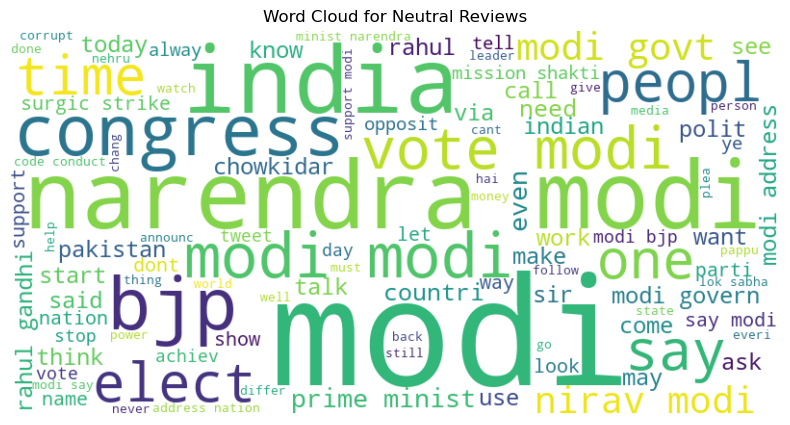

In [45]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud for Neutral Reviews")
plt.show()

In [46]:
# positive word cloud

In [47]:
wordcloud = WordCloud(max_words=100, background_color='white', width=800, height=400).generate(pos_text)

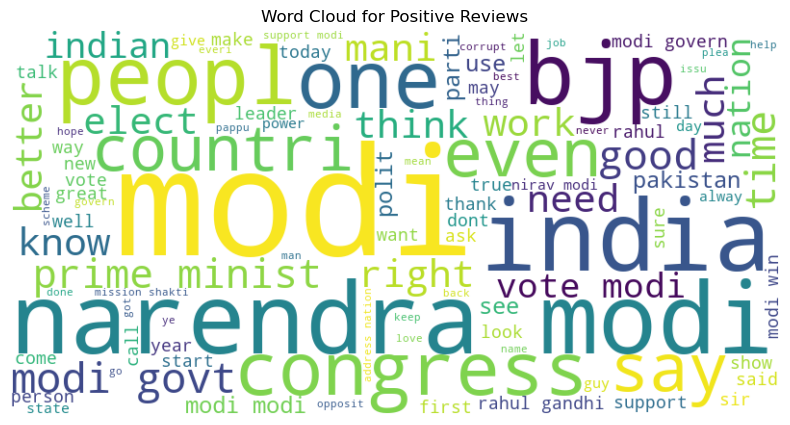

In [48]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud for Positive Reviews")
plt.show()

In [49]:
# machine learning model implimentation using Naive Bayes

In [50]:
# seperating the data and labels

X = df['cleaned_text'].values
y = df['rating'].values

In [51]:
print(X)

['modi promis minimum govern maximum govern expect begin difficult job reform state take year get justic state busi exit psu templ'
 'talk nonsens continu drama vote modi'
 'say vote modi welcom bjp told rahul main campaign modi think modi relax'
 ... 'cover interact forum left'
 'big project came india modi dream project happen realiti'
 'ever listen like gurukul disciplin maintain even narendra modi rss maintain cultur indian attack polit someon attack hinduism rss take action proud']


In [52]:
print(y)

[-1  0  1 ...  0  0  1]


In [56]:
# segricating the Train and Test data

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 30, test_size = 0.3)

In [57]:
# converting text to numerical using vectorizer

vect = TfidfVectorizer()
X_train = vect.fit_transform(X_train) # model fitting
X_test = vect.transform(X_test) # model prediction

In [58]:
print(X_train)

  (0, 15485)	0.2796324258525991
  (0, 11066)	0.29548586157915335
  (0, 43326)	0.3200539448467534
  (0, 45059)	0.3039500746248349
  (0, 18382)	0.24314767835295717
  (0, 40065)	0.2514070833345528
  (0, 8396)	0.3242655620932146
  (0, 18517)	0.351877976628069
  (0, 26639)	0.2965836101882935
  (0, 51898)	0.23068751201470605
  (0, 6383)	0.2694121216064981
  (0, 57820)	0.2731658818504267
  (1, 42937)	0.3939125098818327
  (1, 6111)	0.35911257466698737
  (1, 38424)	0.3499366090650375
  (1, 36962)	0.0804135772610765
  (1, 55354)	0.3551866272838563
  (1, 13027)	0.6283837078966105
  (1, 33117)	0.2567596053736036
  (2, 62381)	0.2762569044141061
  (2, 6659)	0.4108877555796179
  (2, 14406)	0.6803089681388963
  (2, 13926)	0.34505637252405
  (2, 43842)	0.4076253391076034
  (2, 36962)	0.08252736301388289
  :	:
  (114083, 18368)	0.23031932904397864
  (114083, 51511)	0.19308447471807721
  (114083, 17653)	0.23932897842791692
  (114083, 13045)	0.18747301477796513
  (114083, 56893)	0.20164385541605526
  (114

In [59]:
print(X_test)

  (0, 51688)	0.41113119143766036
  (0, 48881)	0.27731122672725567
  (0, 42666)	0.31637905543145434
  (0, 41446)	0.39133473387122847
  (0, 40088)	0.23879769389335834
  (0, 36962)	0.05421941381680136
  (0, 28858)	0.38829099168859543
  (0, 20899)	0.3378865396150831
  (0, 20415)	0.3254730694477163
  (0, 19529)	0.26456952970741093
  (1, 53050)	0.19455472666879378
  (1, 51898)	0.17856567720553765
  (1, 50160)	0.4806573354202399
  (1, 46112)	0.27821654977024485
  (1, 45508)	0.17274173922323793
  (1, 43753)	0.1422374381409383
  (1, 42649)	0.18870266473570116
  (1, 39312)	0.14827316383266595
  (1, 39027)	0.3280138074330652
  (1, 36962)	0.045261575023037584
  (1, 33646)	0.2660938814429405
  (1, 26639)	0.22957312573538743
  (1, 17600)	0.3400379782794856
  (1, 16326)	0.3184119190682253
  (1, 14924)	0.25297942961206793
  :	:
  (48891, 27884)	0.41130074456073595
  (48891, 18356)	0.19193038604804333
  (48891, 17704)	0.5457553251014743
  (48891, 17322)	0.30913485558688547
  (48891, 10361)	0.2621092516

In [75]:
# MultinomialNB

from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [76]:
# segricating the Train and Test data

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 30, test_size = 0.3)

In [77]:
print(X.shape, X_train.shape, X_test.shape)

(162980,) (114086,) (48894,)


In [78]:
# Create a pipeline with TfidfVectorizer and Multinomial Naive Bayes

model = make_pipeline(TfidfVectorizer(), MultinomialNB())

In [79]:
# Train the model

model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('multinomialnb', MultinomialNB())])

In [80]:
# Predict on the test set

y_pred = model.predict(X_test)

In [81]:
y_pred

array([ 1,  1,  1, ...,  1, -1,  1])

In [82]:
# Accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy_score:", accuracy)

Accuracy_score: 0.5673906818832577


In [83]:
# Confusion Matrix

cmx=confusion_matrix(y_test,y_pred) 
print("\n Confustion Matrix : \n",cmx)


 Confustion Matrix : 
 [[ 1221   508  8847]
 [   81  5373 11169]
 [   51   496 21148]]


<Axes: >

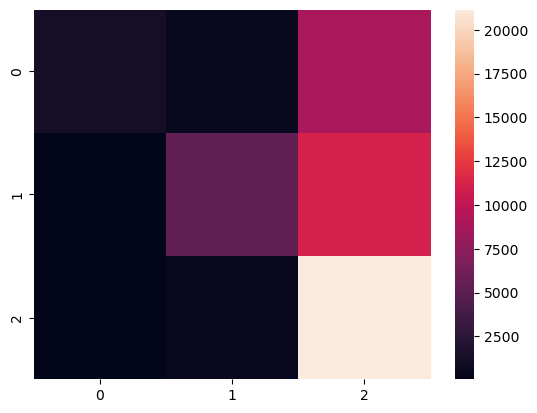

In [84]:
# plotting the confusion matrix

sns.heatmap(cmx)

In [85]:
# Classification report

classify_report = classification_report(y_test, y_pred, target_names=['Negative (-1)','Neutral (0)','Positive (1)'])
print("\nClassification Report:\n",classify_report)


Classification Report:
                precision    recall  f1-score   support

Negative (-1)       0.90      0.12      0.20     10576
  Neutral (0)       0.84      0.32      0.47     16623
 Positive (1)       0.51      0.97      0.67     21695

     accuracy                           0.57     48894
    macro avg       0.75      0.47      0.45     48894
 weighted avg       0.71      0.57      0.50     48894



In [86]:
# Classification report for plotting

classify_report = classification_report(y_test, y_pred, target_names=['Negative (-1)','Neutral (0)','Positive (1)'], output_dict=True)

In [87]:
# classification report in Data Frame

report_df = pd.DataFrame(classify_report).transpose()

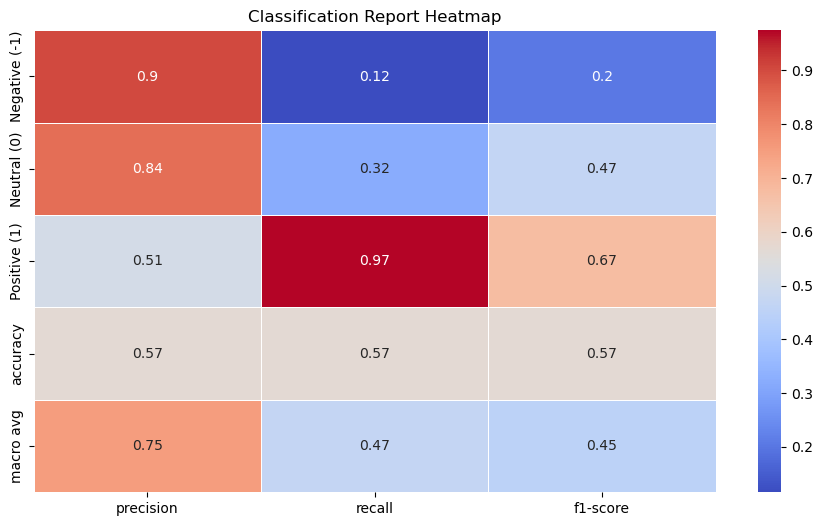

In [88]:
# plotting 

plt.figure(figsize=(11, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Classification Report Heatmap')
plt.show()

In [89]:
# Prediction the negative or positive

# Example prediction 

x_new = X_test[1000]  # Selecting first 1000 rows
print("Actual label:", y_test[1000])

# Make sure to pass the document as a list
prediction = model.predict([x_new])
print("Predicted label:", prediction[0])

# Additional logic based on prediction
if (prediction[0] == -1):
    print("Negative (-1)")
elif (prediction[0] == 0):
    print("Neutral (0)")
else:
    print("Positive (1)")

Actual label: 1
Predicted label: 1
Positive (1)
